# 李宏毅-深度学习
https://www.bilibili.com/video/BV1b4411S7Ky/?spm_id_from=333.788.videocard.4

定义一个神经网络的三个步骤:
1. build nn
2. 确定cost function
3. 确定优化函数
![](deep_learning/img/dl01.png)

# Review basic structure
https://www.bilibili.com/video/BV1b4411S7Ky/?spm_id_from=333.788.videocard.4

## fully connected layer
Dense层在数学上看，就是 输入n为的向量Vn乘以一个矩阵，transform为m维的向量Vm，再经过激活函数做非线性变换

$$V_m=\sigma(V_n*W_{n*m})$$
### 符号表示
![](deep_learning/img/dl02.png)
![](deep_learning/img/dl03.png)
![](deep_learning/img/dl04.png)
![](deep_learning/img/dl05.png)
![](deep_learning/img/dl06.png)
![](deep_learning/img/dl07.png)

## Recurrent Structure
![](deep_learning/img/dr01.png)
### Deep RNN
![](deep_learning/img/dr02.png)

### bidirectional RNN 
![](deep_learning/img/dr04.png)

### pyramidal RNN
DeepRNN, 合并时间步长
![](deep_learning/img/dr05.png)
### Naive RNN
![](deep_learning/img/dn01.png)
### LSTM
![](deep_learning/img/dn03.png)
![](deep_learning/img/dn04.png)
![](deep_learning/img/dn06.png)
$\odot$表示element-wise的相乘 

向量Zi: input gate,决定输入能否流进去

向量Zf: forget gate, 决ct-1能否传入下一个时间点

向量Zo: output gate,
![](deep_learning/img/dn07.png)
![](deep_learning/img/dn08.png)


![](deep_learning/img/lstmresult.png)
### GRU
![](deep_learning/img/dn09.png)






## CNN | Pooling
https://www.bilibili.com/video/BV1b4411S7Ky/?p=2  开始时间 5min

Simplify nn(based on prior knowledge of the task

![](deep_learning/img/cnn01.png)
![](deep_learning/img/cnn02.png)

### conception
* receptive field  
    感受野，来自生物学概念
* filter(kernel)
    * filter(kernel) size  
        该filter覆盖的感受野的大小
    * Stride

### 卷积对应什么样的数学操作
CNN的卷积运算为何使用互相关而不是卷积 https://blog.csdn.net/appleyuchi/article/details/86574350

通俗理解【卷】积+互相关与卷积 https://blog.csdn.net/Sunny_HQ/article/details/80875664


一个二维矩阵经过卷积核处理后是什么结果？当kernel划过对应的感受野时，对应的数学运算叫互相关(即把kernel对应位置和其覆盖的位置对应相乘，然后结果求和)
![](deep_learning/img/cnnm01.png)

CNN的卷积运算并非数学定义的卷积

也就是说，CNN中的运算是不需要翻转卷积核的。

也就是说，CNN在处理图像时的卷积核是不需要翻转180°的

我们来用代码看下为什么？

In [3]:
#-*- coding:utf-8 -*-
import numpy as np
A=np.array([[0,0,0,0],\
                [0,0,30,0],\
                [0,60,0,0],\
                [0,0,0,0]])

B=np.array([[0.1,0.01],\
                [1,10]])
import scipy.signal
print("---------卷积结果---------------------")
print( scipy.signal.convolve(A,B,mode='valid'))
print("---------互相关结果---------------------")
print( scipy.signal.correlate(A,B,mode='valid'))

---------卷积结果---------------------
[[0.00e+00 3.00e+00 3.00e-01]
 [6.00e+00 3.06e+01 3.00e+02]
 [6.00e+01 6.00e+02 0.00e+00]]
---------互相关结果---------------------
[[  0.  300.   30. ]
 [600.   60.3   3. ]
 [  0.6   6.    0. ]]


因为卷积层后面连接的是池化层，
也就是说把卷积结果得到的矩阵中，
选取矩阵中数值最大的元素作为保留，矩阵中其余元素一律删除。

所以我们可以看到：
上述代码的
卷积结果中的最大值
与
互相关结果矩阵中的最大值
都是600
因此后面maxpooling层进行池化后得到的值也都是600.

如果后面接全连接层，那么
上面两个矩阵全部flatten以后输入dense层，几乎完全一致，也不影响建模

结论：
CNN中使用卷积或互相关，对于
的贡献是一致的，都是获取像素最大的那个值，
因此可以使用卷积，也可以使用互相关，
但是为了代码的高效，直接使用“互相关”即可。

### Example-1D signal+Multiple Channel
![](deep_learning/img/cnn03.png)
![](deep_learning/img/cnn04.png)
![](deep_learning/img/cnn05.png)
![](deep_learning/img/cnn06.png)
![](deep_learning/img/cnn07.png)
![](deep_learning/img/cnnp01.png)

# Computational Graph
https://www.bilibili.com/video/BV1b4411S7Ky/?p=3
![](deep_learning/img/cg01.png)


## Feedforward Network 前馈网络的计算图画法
$$y=\sigma(W^L...\sigma(W^2\sigma(W^1x+b^1)+b^2)...+b^L)$$
![](deep_learning/img/cgl01.png)

### Loss Function of Feedforward Network
![](deep_learning/img/cgl02.png)

## Gradient of Cost Function
![](deep_learning/img/cg02.png)

在反向求微分时，遇到的问题是: C是标量，而y, z2, a1, z1等都是向量，标量对向量，向量对向量如何求偏微分呢？

### Jacobian Matrix
向量对向量求偏微分的结果，是一个矩阵，行数是分子向量的维度，列数是分母向量的维度
![](deep_learning/img/cg03.png)

### 实例求解
#### $\frac{\partial C}{\partial{y}}$
以loss function为cross entropy loss为例说明
$$CrossEntropyLoss: l(\vec y, \vec{\hat y})=-\sum_{i=1}^n\hat{y_i}ln(y_i)=-ln(y_r)$$，其中$\hat{y_i}$的第r维为1，其余为0
其中$\vec y$为预测值，$\vec{\hat{y}}$为真实值, 

$$\frac{\partial C}{\partial{y}}=[0 ... \frac{-1}{y_r} ...]$$
![](deep_learning/img/cgr01.png)

#### $\frac{\partial y}{\partial z^2}$
以\sigma为sigmoid函数为例
$$\vec y=[y_1\ y_2\ ...]=[\sigma(z_1^2)\ (\sigma z_2^2)\ ....]$$
![](deep_learning/img/cgr02.png)

#### $\frac{\partial z^2}{\partial a^1}$
$$\frac{\partial z^2}{\partial a^1}=W^2$$
![](deep_learning/img/cgr03.png)

#### $\frac{\partial z^2}{\partial W^2}$
把矩阵拉平为向量
![](deep_learning/img/cgr04.png)

#### $\frac{C}{\partial W^1}$
![](deep_learning/img/cgr05.png)

## Computational Graph for Recurrent Network
输入为时间步长为1步
![](deep_learning/img/cgr11.png)
输入为时间步长为3步
![](deep_learning/img/cgr12.png)


![](deep_learning/img/cgr14.png)
![](deep_learning/img/cgr15.png)

# Attention and Transformer
## 翻译中的attention
https://www.bilibili.com/video/BV1b4411S7Ky?p=8  25min attention  by 李宏毅

https://jalammar.github.io/visualizing-neural-machine-translation-mechanics-of-seq2seq-models-with-attention/ 过程可视化

传统的seq2seq模型，先由encoder把一个句子编码为一个向量，然后把这个向量作为decoder的输入，每次时间步都输入，直到decoder产生结束标志为止。

传统的seq2seq模型的问题是 整个句子被编码为一个向量，decoder看到的是相同的。
![](deep_learning/img/att00.png)
而以机器翻译为例，输入句子的不同部分对输出的影响是不同的。所以引出了attention
![](deep_learning/img/att01.png)
z0是一个初始的向量，其参数可以学出来
![](deep_learning/img/att02.png)
z1是把c0丢进decoder中rnn的隐层输出，
![](deep_learning/img/att03.png)
把z1再和h1...等算一次得到c1
![](deep_learning/img/att04.png)
![](deep_learning/img/att06.png)

## Transformer
https://www.bilibili.com/video/BV13t411j7PM/?spm_id_from=333.788.videocard.0

https://jalammar.github.io/illustrated-transformer/

Transformer是一个典型的encoder-decoder结构
![](deep_learning/img/trans01.png)
![](deep_learning/img/trans02.png)
![](deep_learning/img/trans03.png)
![](deep_learning/img/trans04.png)



### Encoder
#### Scaled Dot-Product Attention
$$Attention(Q,K,V)=softmax(\frac{QK^T}{\sqrt d_k})V$$
Q,K,V是3个矩阵

    Q=np.array([q1,q2...])
    K=np.array([k1,k2...])
    V=np.array([v1,v2...])
#### self-attention
Q,K,V来自同一个序列
![](deep_learning/img/trans05.png)
输入是一个序列thinking machines，输出是一个序列z1,z2。可以看出，attention和rnn的作用是一致的

attention和rnn的不同点是，attention的输出如z1考虑了整个序列后得到的，rnn的输出只考虑了相应的时间步长之前的序列

attention的计算可以并行化，而rnn由于必须先得到之前序列的向量，才能计算当前序列的向量，因此不能并行
![](deep_learning/img/trans06.png)
#### Matrix Calculation of Self-Attention
![](deep_learning/img/atte01.png)
![](deep_learning/img/atte02.png)



#### multi-head attention
重复把上面的过程做了n次，可以改进性能的原因是 可以关注多个不同的位置。Transformer使用八个关注头
![](deep_learning/img/trans07.png)



### The Decoder Side
现在，我们已经涵盖了编码器方面的大多数概念，我们基本上知道了解码器的组件也如何工作。 但是，让我们看一下它们如何协同工作。

编码器首先处理输入序列。 然后，顶部编码器的输出转换为注意向量K和V的集合。每个解码器将在其“encoder-decoder attention”层中使用它们，这有助于解码器将注意力集中在输入序列中的适当位置：

### The Final Linear and Softmax Layer
解码器堆栈输出浮点向量。 我们如何把它变成一个词？ 这就是最后的线性层，然后是Softmax层的工作。

线性层是一个简单的完全连接的神经网络，它将解码器堆栈产生的向量投影到一个更大的向量中，称为logits vector。

假设我们的模型知道从其训练数据集中学习的10,000个唯一的英语单词（我们模型的“输出词汇”）。 这将使logits向量的宽度变为10,000个单元-每个单元对应一个唯一单词的分数。 这就是我们解释模型的输出以及线性层的方式。

然后，softmax层将那些分数转换为概率（全部为正，全部相加为1.0）。 选择具有最高概率的单元，并生成与该单元相关联的单词作为该时间步的输出。

# Bert
[The Illustrated BERT, ELMo, and co. (How NLP Cracked Transfer Learning)](https://jalammar.github.io/illustrated-bert/)

BERT is basically a trained Transformer Encoder stack. 

![](deep_learning/img/att07.png)

这两种BERT模型的尺寸都有大量的编码器层（which the paper calls Transformer Blocks）–基本版本为十二层，大型版本为二十四层。 与初始论文中Transformer的参考实现中的默认配置（6个编码器层，512个隐藏单元， 和8个关注头）相比，这些设备还具有更大的前馈网络（分别为768和1024个隐藏单元）和更多关注头（分别为12和16）。
## Model Inputs
为第一个输入令牌提供特殊的[CLS]令牌，其原因将在以后变得显而易见。 CLS在这里代表分类。

就像transformer的编码器一样，BERT接受一系列单词作为输入，这些单词一直在堆栈中向上流动。 每一层都进行自我关注，并将其结果通过前馈网络传递，然后将其传递给下一个编码器。
![](deep_learning/img/att08.png)

在架构方面，到目前为止，这与Transformer相同（除了大小，这只是我们可以设置的配置）。 首先，在输出端我们开始看到事情如何分歧。

## Model Outputs
每个位置输出一个大小为hidden_size（在BERT Base中为768）的向量。 对于上面我们看过的句子分类示例，我们仅关注第一个位置（我们将特殊的[CLS]令牌的输出。

该向量现在可以用作我们选择的分类器的输入。 本文仅通过使用单层神经网络作为分类器就取得了很好的效果。
![](deep_learning/img/att09.png)

# 损失函数loss function
损失函数:衡量模型输出与真实标签的差异
## 损失函数(Loss Function):
𝑳𝒐𝒔𝒔 = 𝒇(𝒚^, 𝒚)
## 代价函数(Cost Function):
$$Cost=\frac{1}{N}\sum_i^Nf(\hat y_i, y_i)$$
## 目标函数(Objective Function):
𝑶𝒃𝒋 = 𝑪𝒐𝒔𝒕 + Regularization


# 优化器

## SGD

In [ ]:
《On the importance of initialization and momentum in deep learning》


## Momentum动量加速
基础是指数加权平均

### 指数加权平均(Exponential weighted average)
$$v_t=\beta v_{t-1}+(1-\beta)\theta_t$$

$\theta_t$表示当天的值
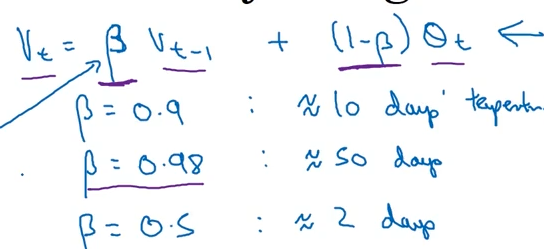

$\beta=0.9$时，$v_t$约等于近10天的平均温度；

$\beta=0.5$时，$v_t$约等于近2天的平均温度；

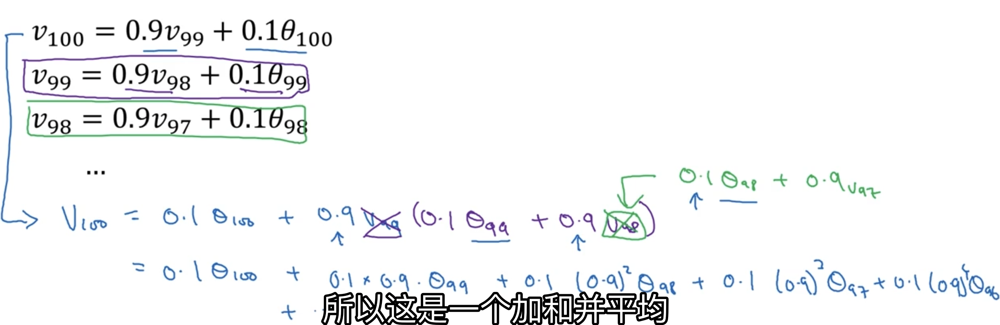

#### Bias correction
指的是当指数加权平均开始时，值很小的情况修正
方法：$\frac{v_t}{(1-\beta^t)}$
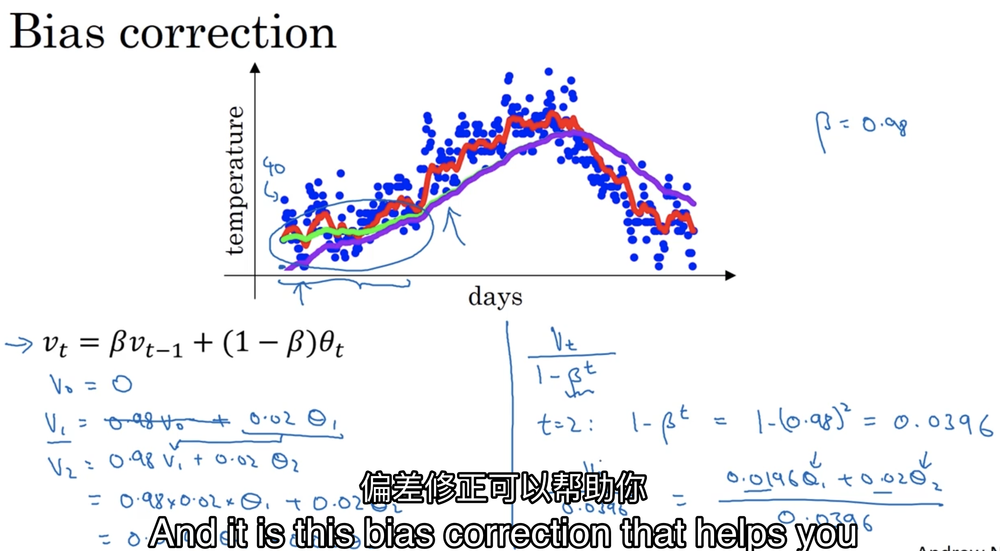

### 原理
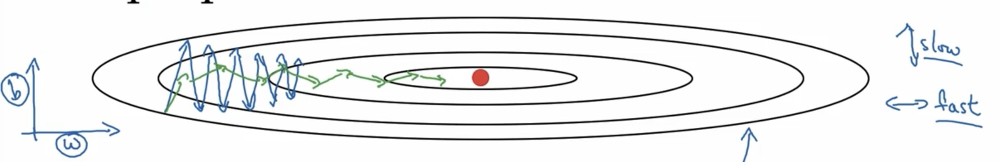

理想的情况是我们希望在b方向更新的慢一些（db小一些），而在w方向更新的快一些(dw大一些)。

使用指数加权平均可以达到目的。如：b方向上db每次的方向不同，就抵消了，而w方向上，每次方向相同而得到增强。

### 实现细节
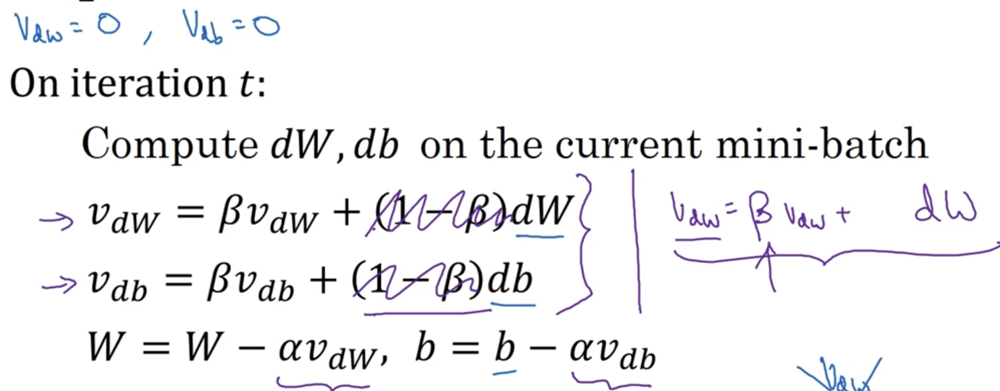

有两个超参数: $\alpha和\beta, \beta是加权平均数，通常取值0.9$，所以实际平均了前10次的梯度。

## RMSprop
root mean square prop
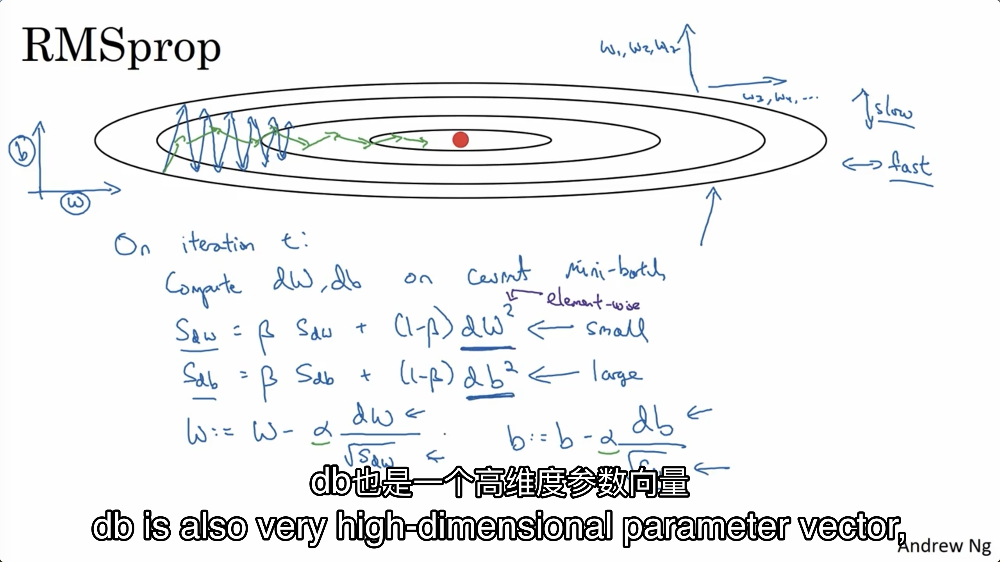

## Adam
Adaptive Moment Estimation

结合了前面的Momentum和RMSprop,
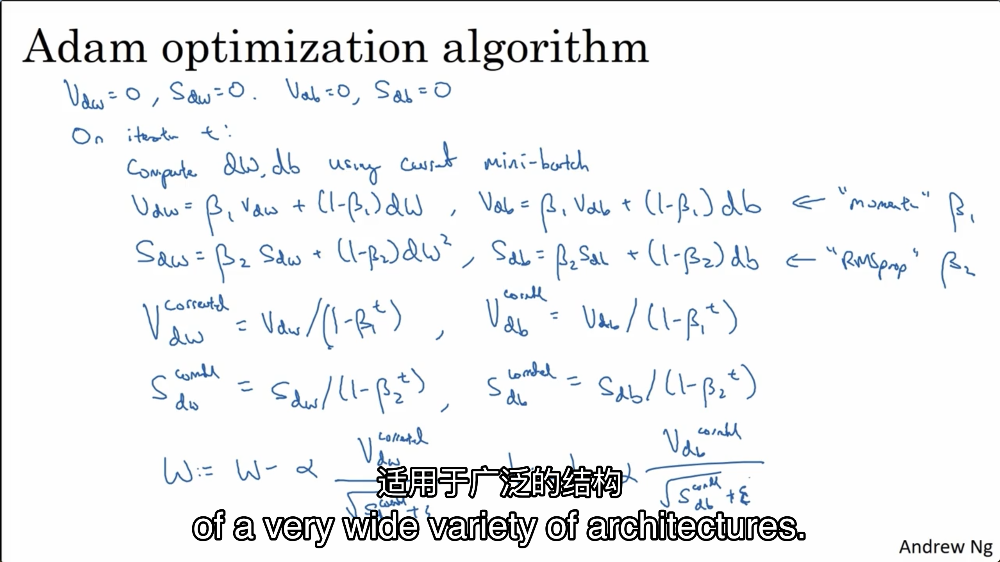

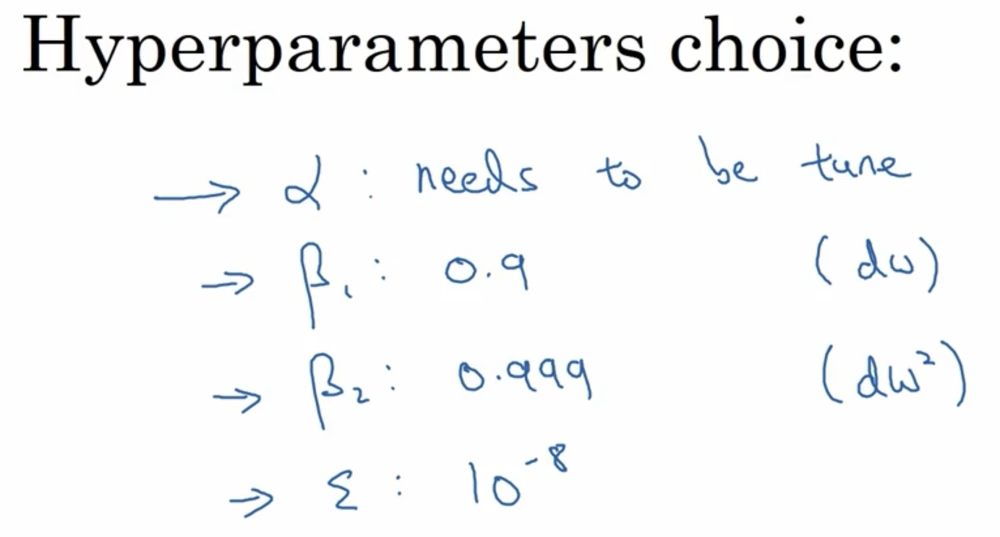

## Learning Rate Decay

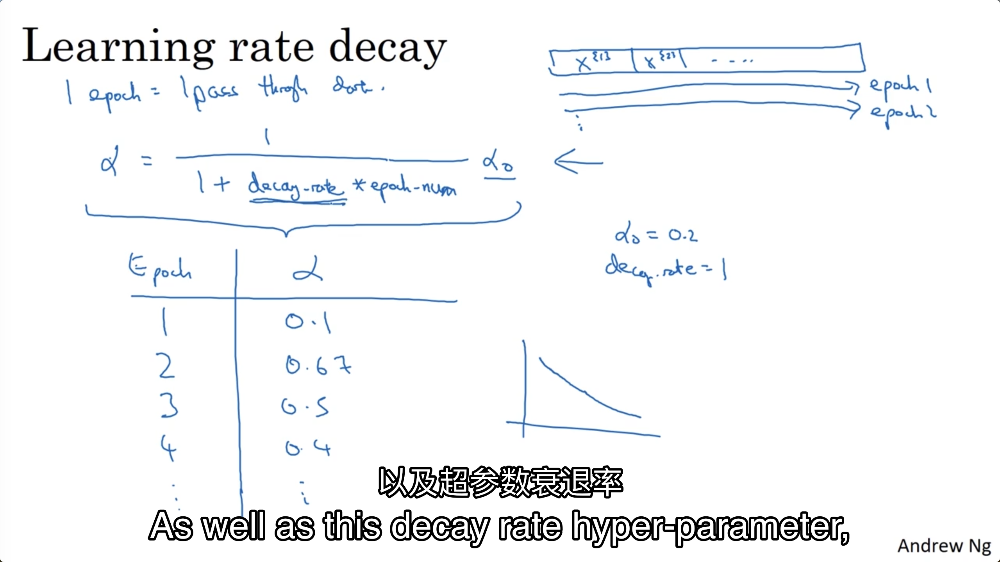

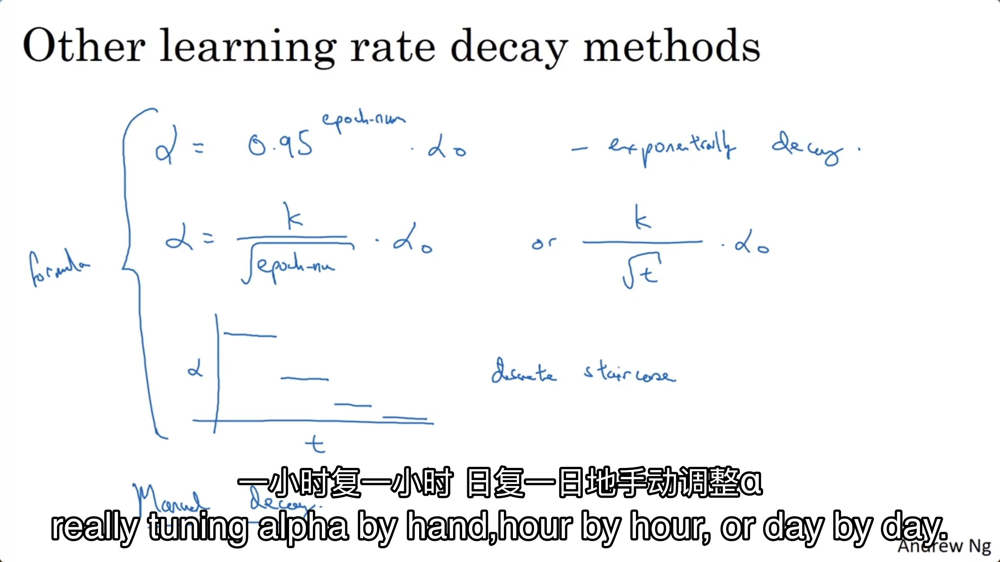

In [ ]:
optim.Adagrad: 《Adaptive Subgradient Methods for Online Learning and Stochastic Optimization》


In [ ]:
optim.RMSprop: http://www.cs.toronto.edu/~tijmen/csc321/slides/lecture_slides_lec6.pdf


In [ ]:
optim.Adam: 《Adam: A Method for Stochastic Optimization》


In [ ]:
optim.Adadelta: 《 AN ADAPTIVE LEARNING RATE METHOD》


In [ ]:
optim.Adamax: 《Adam: A Method for Stochastic Optimization》


In [ ]:
optim.SparseAdam


In [ ]:
optim.ASGD:《Accelerating Stochastic Gradient Descent using Predictive Variance Reduction》


In [ ]:
optim.Rprop:《Martin Riedmiller und Heinrich Braun》


In [ ]:
optim.LBFGS:BDGS的改进

# 正则化

## weight decay(L1,L2)

## dropout
Train的时候神经元会有drop_prob的概率随机失活(即对应的权重为0)

这时，该层的每一个神经元的输出数据尺度变为原来的1-drop_prob

Test时，由于应用所有的神经元做预测，所以所有的权重需要乘以1-drop_prob，才能保证输出的数据尺度和Train时相同

In [2]:
from IPython.display import IFrame
IFrame('http://jmlr.org/papers/volume15/srivastava14a/srivastava14a.pdf', width=1200, height=450)

## 批量归一化batch normalization
### 参考文献

[1] Ioffe, S., & Szegedy, C. (2015). Batch normalization: Accelerating deep network training by reducing internal covariate shift. arXiv preprint arXiv:1502.03167.

In [1]:
from IPython.display import IFrame
IFrame('https://arxiv.org/pdf/1502.03167', width=1200, height=450)

### Internal Covariate Shift
导致数据在逐层传递过程中方差逐渐消失或爆炸

### BN的好处
标准化:0均值，1方差

1. 可以用更大学习率，加速模型收敛
2. 可以不用精心设计权值初始化
3. 可以不用dropout或较小的dropout
4. 可以不用L2或者较小的weight decay
5. 可以不用LRN(local response normalization)

### 计算公式
![](img/bn01.png)
其中\beta和\gamma是作为参数在训练中学习到的
### 批量归一化层

对全连接层和卷积层做批量归一化的方法稍有不同。下面我们将分别介绍这两种情况下的批量归一化。

#### 对全连接层做批量归一化
通常，我们将批量归一化层置于全连接层中的仿射变换和激活函数之间。设全连接层的输入为$\boldsymbol{u}$，权重参数和偏差参数分别为$\boldsymbol{W}$和$\boldsymbol{b}$，激活函数为$\phi$。设批量归一化的运算符为$\text{BN}$。那么，使用批量归一化的全连接层的输出为

$$\phi(\text{BN}(\boldsymbol{x})),$$

其中批量归一化输入$\boldsymbol{x}$由仿射变换

$$\boldsymbol{x} = \boldsymbol{W\boldsymbol{u} + \boldsymbol{b}}$$

得到。考虑一个由$m$个样本组成的小批量，仿射变换的输出为一个新的小批量$\mathcal{B} = \{\boldsymbol{x}^{(1)}, \ldots, \boldsymbol{x}^{(m)} \}$。它们正是批量归一化层的输入。对于小批量$\mathcal{B}$中任意样本$\boldsymbol{x}^{(i)} \in \mathbb{R}^d, 1 \leq  i \leq m$，批量归一化层的输出同样是$d$维向量

$$\boldsymbol{y}^{(i)} = \text{BN}(\boldsymbol{x}^{(i)}),$$

并由以下几步求得。首先，对小批量$\mathcal{B}$求均值和方差：

$$\boldsymbol{\mu}_\mathcal{B} \leftarrow \frac{1}{m}\sum_{i = 1}^{m} \boldsymbol{x}^{(i)},$$
$$\boldsymbol{\sigma}_\mathcal{B}^2 \leftarrow \frac{1}{m} \sum_{i=1}^{m}(\boldsymbol{x}^{(i)} - \boldsymbol{\mu}_\mathcal{B})^2,$$

其中的平方计算是按元素求平方。接下来，使用按元素开方和按元素除法对$\boldsymbol{x}^{(i)}$标准化：

$$\hat{\boldsymbol{x}}^{(i)} \leftarrow \frac{\boldsymbol{x}^{(i)} - \boldsymbol{\mu}_\mathcal{B}}{\sqrt{\boldsymbol{\sigma}_\mathcal{B}^2 + \epsilon}},$$

这里$\epsilon > 0$是一个很小的常数，保证分母大于0。在上面标准化的基础上，批量归一化层引入了两个可以学习的模型参数，拉伸（scale）参数 $\boldsymbol{\gamma}$ 和偏移（shift）参数 $\boldsymbol{\beta}$。这两个参数和$\boldsymbol{x}^{(i)}$形状相同，皆为$d$维向量。它们与$\hat{\boldsymbol{x}}^{(i)}$分别做按元素乘法（符号$\odot$）和加法计算：

$${\boldsymbol{y}}^{(i)} \leftarrow \boldsymbol{\gamma} \odot \hat{\boldsymbol{x}}^{(i)} + \boldsymbol{\beta}.$$

至此，我们得到了$\boldsymbol{x}^{(i)}$的批量归一化的输出$\boldsymbol{y}^{(i)}$。
值得注意的是，可学习的拉伸和偏移参数保留了不对$\boldsymbol{x}^{(i)}$做批量归一化的可能：此时只需学出$\boldsymbol{\gamma} = \sqrt{\boldsymbol{\sigma}_\mathcal{B}^2 + \epsilon}$和$\boldsymbol{\beta} = \boldsymbol{\mu}_\mathcal{B}$。我们可以对此这样理解：如果批量归一化无益，理论上，学出的模型可以不使用批量归一化。


#### 对卷积层做批量归一化

对卷积层来说，批量归一化发生在卷积计算之后、应用激活函数之前。如果卷积计算输出多个通道，我们需要对这些通道的输出分别做批量归一化，且每个通道都拥有独立的拉伸和偏移参数，并均为标量。设小批量中有$m$个样本。在单个通道上，假设卷积计算输出的高和宽分别为$p$和$q$。我们需要对该通道中$m \times p \times q$个元素同时做批量归一化。对这些元素做标准化计算时，我们使用相同的均值和方差，即该通道中$m \times p \times q$个元素的均值和方差。


#### 预测时的批量归一化

使用批量归一化训练时，我们可以将批量大小设得大一点，从而使批量内样本的均值和方差的计算都较为准确。将训练好的模型用于预测时，我们希望模型对于任意输入都有确定的输出。因此，单个样本的输出不应取决于批量归一化所需要的随机小批量中的均值和方差。一种常用的方法是通过移动平均估算整个训练数据集的样本均值和方差，并在预测时使用它们得到确定的输出。

可见，和dropout一样，批量归一化层在训练模式和预测模式下的计算结果也是不一样的。


### 从零开始实现

下面我们通过`NDArray`来实现批量归一化层。

In [1]:
import d2lzh as d2l
from mxnet import autograd, gluon, init, nd
from mxnet.gluon import nn

def batch_norm(X, gamma, beta, moving_mean, moving_var, eps, momentum):
    # 通过autograd来判断当前模式是训练模式还是预测模式
    if not autograd.is_training():
        # 如果是在预测模式下，直接使用传入的移动平均所得的均值和方差
        X_hat = (X - moving_mean) / nd.sqrt(moving_var + eps)
    else:
        assert len(X.shape) in (2, 4)
        if len(X.shape) == 2:
            # 使用全连接层的情况，计算特征维上的均值和方差
            mean = X.mean(axis=0)
            var = ((X - mean) ** 2).mean(axis=0)
        else:
            # 使用二维卷积层的情况，计算通道维上（axis=1）的均值和方差。这里我们需要保持
            # X的形状以便后面可以做广播运算
            mean = X.mean(axis=(0, 2, 3), keepdims=True)
            var = ((X - mean) ** 2).mean(axis=(0, 2, 3), keepdims=True)
        # 训练模式下用当前的均值和方差做标准化
        X_hat = (X - mean) / nd.sqrt(var + eps)
        # 更新移动平均的均值和方差
        moving_mean = momentum * moving_mean + (1.0 - momentum) * mean
        moving_var = momentum * moving_var + (1.0 - momentum) * var
    Y = gamma * X_hat + beta  # 拉伸和偏移
    return Y, moving_mean, moving_var

接下来，我们自定义一个`BatchNorm`层。它保存参与求梯度和迭代的拉伸参数`gamma`和偏移参数`beta`，同时也维护移动平均得到的均值和方差，以便能够在模型预测时被使用。`BatchNorm`实例所需指定的`num_features`参数对于全连接层来说应为输出个数，对于卷积层来说则为输出通道数。该实例所需指定的`num_dims`参数对于全连接层和卷积层来说分别为2和4。

In [2]:
class BatchNorm(nn.Block):
    def __init__(self, num_features, num_dims, **kwargs):
        super(BatchNorm, self).__init__(**kwargs)
        if num_dims == 2:
            shape = (1, num_features)
        else:
            shape = (1, num_features, 1, 1)
        # 参与求梯度和迭代的拉伸和偏移参数，分别初始化成1和0
        self.gamma = self.params.get('gamma', shape=shape, init=init.One())
        self.beta = self.params.get('beta', shape=shape, init=init.Zero())
        # 不参与求梯度和迭代的变量，全在内存上初始化成0
        self.moving_mean = nd.zeros(shape)
        self.moving_var = nd.zeros(shape)

    def forward(self, X):
        # 如果X不在内存上，将moving_mean和moving_var复制到X所在显存上
        if self.moving_mean.context != X.context:
            self.moving_mean = self.moving_mean.copyto(X.context)
            self.moving_var = self.moving_var.copyto(X.context)
        # 保存更新过的moving_mean和moving_var
        Y, self.moving_mean, self.moving_var = batch_norm(
            X, self.gamma.data(), self.beta.data(), self.moving_mean,
            self.moving_var, eps=1e-5, momentum=0.9)
        return Y

### 使用批量归一化层的LeNet

下面我们修改[“卷积神经网络（LeNet）”](lenet.ipynb)这一节介绍的LeNet模型，从而应用批量归一化层。我们在所有的卷积层或全连接层之后、激活层之前加入批量归一化层。

In [3]:
net = nn.Sequential()
net.add(nn.Conv2D(6, kernel_size=5),
        BatchNorm(6, num_dims=4),
        nn.Activation('sigmoid'),
        nn.MaxPool2D(pool_size=2, strides=2),
        nn.Conv2D(16, kernel_size=5),
        BatchNorm(16, num_dims=4),
        nn.Activation('sigmoid'),
        nn.MaxPool2D(pool_size=2, strides=2),
        nn.Dense(120),
        BatchNorm(120, num_dims=2),
        nn.Activation('sigmoid'),
        nn.Dense(84),
        BatchNorm(84, num_dims=2),
        nn.Activation('sigmoid'),
        nn.Dense(10))

下面我们训练修改后的模型。

In [4]:
lr, num_epochs, batch_size, ctx = 1.0, 5, 256, d2l.try_gpu()
net.initialize(ctx=ctx, init=init.Xavier())
trainer = gluon.Trainer(net.collect_params(), 'sgd', {'learning_rate': lr})
train_iter, test_iter = d2l.load_data_fashion_mnist(batch_size)
d2l.train_ch5(net, train_iter, test_iter, batch_size, trainer, ctx,
              num_epochs)

training on gpu(0)
epoch 1, loss 0.6847, train acc 0.757, test acc 0.731, time 3.1 sec
epoch 2, loss 0.3959, train acc 0.857, test acc 0.872, time 3.0 sec
epoch 3, loss 0.3542, train acc 0.872, test acc 0.866, time 3.0 sec
epoch 4, loss 0.3243, train acc 0.882, test acc 0.870, time 3.0 sec
epoch 5, loss 0.3079, train acc 0.888, test acc 0.859, time 3.1 sec


最后我们查看第一个批量归一化层学习到的拉伸参数`gamma`和偏移参数`beta`。

In [5]:
net[1].gamma.data().reshape((-1,)), net[1].beta.data().reshape((-1,))

(
 [2.4271233 1.3619573 1.9445467 0.869272  1.1153986 1.2763852]
 <NDArray 6 @gpu(0)>, 
 [ 1.1752225   0.09482412  0.30369616  0.74578875 -0.7846557  -1.104603  ]
 <NDArray 6 @gpu(0)>)

### 简洁实现

与我们刚刚自己定义的`BatchNorm`类相比，Gluon中`nn`模块定义的`BatchNorm`类使用起来更加简单。它不需要指定自己定义的`BatchNorm`类中所需的`num_features`和`num_dims`参数值。在Gluon中，这些参数值都将通过延后初始化而自动获取。下面我们用Gluon实现使用批量归一化的LeNet。

In [6]:
net = nn.Sequential()
net.add(nn.Conv2D(6, kernel_size=5),
        nn.BatchNorm(),  ## 注意BN的位置！！！
        nn.Activation('sigmoid'),
        nn.MaxPool2D(pool_size=2, strides=2),
        nn.Conv2D(16, kernel_size=5),
        nn.BatchNorm(),
        nn.Activation('sigmoid'),
        nn.MaxPool2D(pool_size=2, strides=2),
        nn.Dense(120),
        nn.BatchNorm(),
        nn.Activation('sigmoid'),
        nn.Dense(84),
        nn.BatchNorm(),
        nn.Activation('sigmoid'),
        nn.Dense(10))

### 小结

* 在模型训练时，批量归一化利用小批量上的均值和标准差，不断调整神经网络的中间输出，从而使整个神经网络在各层的中间输出的数值更稳定。
* 对全连接层和卷积层做批量归一化的方法稍有不同。
* 批量归一化层和丢弃层一样，在训练模式和预测模式的计算结果是不一样的。
* Gluon提供的BatchNorm类使用起来简单、方便。

### 练习

* 能否将批量归一化前的全连接层或卷积层中的偏差参数去掉？为什么？（提示：回忆批量归一化中标准化的定义。）
* 尝试调大学习率。同[“卷积神经网络（LeNet）”](lenet.ipynb)一节中未使用批量归一化的LeNet相比，现在是不是可以使用更大的学习率？
* 尝试将批量归一化层插入LeNet的其他地方，观察并分析结果的变化。
* 尝试一下不学习拉伸参数`gamma`和偏移参数`beta`（构造的时候加入参数`grad_req='null'`来避免计算梯度），观察并分析结果。
* 查看`BatchNorm`类的文档来了解更多使用方法，例如，如何在训练时使用基于全局平均的均值和方差。

## layer norm
主要解决BN无法应用于变长的nn，如RNN

LN思路: 逐层计算均值和方差

注意事项：
* LN不再统计一个batch内的均值和方差
* gamma和beta为element-wise的。 

In [3]:
from IPython.display import IFrame
IFrame('https://arxiv.org/pdf/1607.06450', width=1200, height=450)

## Instance Normalization 
* 起因:BN在图像生成(Image Generation)中不适用 
* 思路:逐Instance(channel)计算均值和方差

## Group Normalization 
应用场景:大模型(小batch size)任务

* 起因:小batch样本中，BN估计的值不准 
* 思路:数据不够，通道来凑

注意事项:
1. 不再有running_mean和running_var 
2. gamma和beta为逐通道(channel)的


# 花书
http://www.deeplearningbook.org/